### changes: removing images0-7 and visual from cols_to_cluster

first: clone: https://github.com/AllenInstitute/visual_behavior_glm  
Add to python path

In [3]:
import visual_behavior_glm

In [4]:
import visual_behavior_glm.src.GLM_params as glm_params
import visual_behavior_glm.src.GLM_analysis_tools as gat
from visual_behavior_glm.src.glm import GLM
import matplotlib.pyplot as plt
import visual_behavior.data_access.loading as loading
import visual_behavior.database as db
import plotly.express as px

import pandas as pd
import numpy as np
import os

from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns

In [30]:
%matplotlib inline


UsageError: Line magic function `%widescreen` not found.


## get results for glm version 4

In [6]:
results_all = gat.retrieve_results(results_type='full')

In [7]:
results_all['glm_version'].unique()
#use v4

array(['3', '4_L2_optimize_by_session', '4_L2_fixed_lambda=1',
       '4_L2_optimize_by_cell', '2', '4_L2_opt_by_cell_tighter_grid',
       '4_L2_opt_by_session_tighter_grid', '5_L2_fixed_lambda=1',
       '5_L2_optimize_by_cell', '5_L2_optimize_by_session'], dtype=object)

In [8]:
rs = gat.retrieve_results(search_dict = {'glm_version': '4_L2_optimize_by_cell'}, results_type='summary')
len(rs)

1365760

### make a new column called 'identifier' that is {OPHYS_EXPERIMENT_ID}_{CELL_SPECIMEN_ID}. This will give each a unique ID

In [9]:
rs['identifier'] = rs['ophys_experiment_id'].astype(str) + '_' +  rs['cell_specimen_id'].astype(str)

In [10]:
rs

,_id,index,dropout,variance_explained,fraction_change_from_full,absolute_change_from_full,cell_specimen_id,ophys_experiment_id,ophys_session_id,behavior_session_id,...,super_container_id,cre_line,session_tags,failure_tags,exposure_number,model_outputs_available,location,glm_version,entry_time_utc,identifier
0,5f22221a7eeb3a3cbb69c983,0,Full,0.229436,0.000000,0.000000,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.596382,991852008_1017215561
1,5f22221a7eeb3a3cbb69c984,1,intercept,0.229937,0.002183,0.000501,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.598786,991852008_1017215561
2,5f22221a7eeb3a3cbb69c985,2,time,0.229769,0.001453,0.000333,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.600893,991852008_1017215561
3,5f22221a7eeb3a3cbb69c986,3,pre_licks,0.229634,0.000864,0.000198,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.603036,991852008_1017215561
4,5f22221a7eeb3a3cbb69c987,4,post_licks,0.227139,-0.010010,-0.002297,1017215561,991852008,991639544,991662910,...,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.605159,991852008_1017215561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365755,5f24621b2ac3d684bf7369e9,27,model_omissions1,0.048034,0.048249,0.002211,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.153505,808621034_962642740
1365756,5f24621b2ac3d684bf7369ea,28,model_timing1D,0.048441,0.057133,0.002618,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.156075,808621034_962642740
1365757,5f24621b2ac3d684bf7369eb,29,all-images,0.039222,-0.144061,-0.006601,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.158640,808621034_962642740
1365758,5f24621b2ac3d684bf7369ec,30,visual,0.034920,-0.237943,-0.010903,962642740,808621034,808340530,808432167,...,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.161200,808621034_962642740


### pivot the table to get it into a form for clustering

In [11]:
rsp = rs.pivot(index='identifier',columns='dropout',values='fraction_change_from_full').reset_index()
rsp
# rsp = rs.pivot(index=['ophys_experiment_id','cell_specimen_id'],columns='dropout',values='fraction_change_from_full')

dropout,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,...,omissions,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,pupil,rewards,running,time,visual
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,...,0.008544,0.007587,-0.005937,0.011424,0.014952,-0.074100,0.010710,-0.020992,-0.001004,-0.228425
1,1000743008_1003146177,-0.0,0.085372,-0.009939,-0.004046,-0.123170,-0.096961,-0.024053,-0.008854,-0.028034,...,-0.243510,-0.071303,-0.059572,-0.210135,-0.300627,-0.115810,-0.231755,-0.051469,-0.000785,-0.039939
2,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,...,0.020436,0.001011,0.003103,0.031004,0.037226,0.005513,0.032333,-0.002625,0.000434,-0.252412
3,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,...,-0.000316,-0.004966,0.002149,0.003036,0.008150,-0.057209,-0.000740,0.014037,0.004291,-0.319959
4,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,...,0.002760,-0.001018,0.000574,0.004443,0.004108,0.005936,0.011120,0.001867,0.002495,-0.435852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42675,995439942_994310000,0.0,-0.485011,0.007001,0.004174,0.067006,0.025908,0.024597,0.014368,0.014290,...,0.106612,0.027403,0.043114,0.107631,0.157746,-0.034934,0.070162,0.002936,-0.020402,-0.542672
42676,995439942_994310003,0.0,-1.118526,0.042506,0.000775,0.003791,0.001357,0.004339,0.000590,-0.000652,...,0.004121,0.005182,-0.001993,0.002772,0.005179,-0.003617,0.017730,0.001021,-0.057415,-1.165996
42677,995439942_994310018,0.0,-0.541743,0.006398,0.003886,0.040050,0.036957,0.039209,0.019981,-0.008514,...,0.094648,0.015220,0.040880,0.117245,0.166319,0.013375,0.064248,0.013400,-0.003067,-0.598106
42678,995439942_994310024,0.0,-0.277435,0.013547,0.000625,0.005525,0.004325,0.005053,0.000903,0.003351,...,-0.010042,-0.002331,0.003029,0.002511,0.019762,-0.083882,0.011392,-0.028149,0.004683,-0.380402


### merge in the identifier, cre_line, session_type and equipment_name columns

In [12]:
rspm = rsp.merge(rs[['identifier','cre_line','session_type','equipment_name']].drop_duplicates(),left_on='identifier',right_on='identifier',how='inner')
rspm

,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,...,pre_lick_bouts,pre_licks,pupil,rewards,running,time,visual,cre_line,session_type,equipment_name
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,...,0.011424,0.014952,-0.074100,0.010710,-0.020992,-0.001004,-0.228425,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
1,1000743008_1003146177,-0.0,0.085372,-0.009939,-0.004046,-0.123170,-0.096961,-0.024053,-0.008854,-0.028034,...,-0.210135,-0.300627,-0.115810,-0.231755,-0.051469,-0.000785,-0.039939,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
2,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,...,0.031004,0.037226,0.005513,0.032333,-0.002625,0.000434,-0.252412,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
3,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,...,0.003036,0.008150,-0.057209,-0.000740,0.014037,0.004291,-0.319959,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
4,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,...,0.004443,0.004108,0.005936,0.011120,0.001867,0.002495,-0.435852,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42675,995439942_994310000,0.0,-0.485011,0.007001,0.004174,0.067006,0.025908,0.024597,0.014368,0.014290,...,0.107631,0.157746,-0.034934,0.070162,0.002936,-0.020402,-0.542672,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4
42676,995439942_994310003,0.0,-1.118526,0.042506,0.000775,0.003791,0.001357,0.004339,0.000590,-0.000652,...,0.002772,0.005179,-0.003617,0.017730,0.001021,-0.057415,-1.165996,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4
42677,995439942_994310018,0.0,-0.541743,0.006398,0.003886,0.040050,0.036957,0.039209,0.019981,-0.008514,...,0.117245,0.166319,0.013375,0.064248,0.013400,-0.003067,-0.598106,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4
42678,995439942_994310024,0.0,-0.277435,0.013547,0.000625,0.005525,0.004325,0.005053,0.000903,0.003351,...,0.002511,0.019762,-0.083882,0.011392,-0.028149,0.004683,-0.380402,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4


### add a column for session ID (1, 3, 4, or 6)

In [13]:
def map_session_types(session_type):
    session_id = session_type[6:7]
    return session_id
rspm['session_id'] = rspm['session_type'].map(lambda st:map_session_types(st))
rspm['session_id'].unique()

array(['1', '3', '4', '6'], dtype=object)

### save feature matrix to disk

In [ ]:
save = False
if save:
    rspm.to_csv('/allen/programs/braintv/workgroups/nc-ophys/visual_behavior/ophys_glm/fraction_change_var_explained_v_4_L2_fixed_lambda=1_2020.08.09.csv', index=False)

### get the column names to use for clustering

In [18]:
cols_for_clustering = [col for col in rspm.columns if col not in ['identifier','cre_line','session_type','equipment_name', 'session_id']]
cols_for_clustering = [col for col in cols_for_clustering if col not in ['image0','image1','image2','image3','image4','image5','image6','image7',
                                                                  'visual']]

cols_for_clustering

['Full',
 'all-images',
 'beh_model',
 'change',
 'correct_rejects',
 'false_alarms',
 'hits',
 'image_expectation',
 'intercept',
 'misses',
 'model_bias',
 'model_omissions1',
 'model_task0',
 'model_timing1D',
 'omissions',
 'post_lick_bouts',
 'post_licks',
 'pre_lick_bouts',
 'pre_licks',
 'pupil',
 'rewards',
 'running',
 'time']

### do k-means on the full feature matrix

In [16]:
# create kmeans object
kmeans = KMeans(n_clusters=4)

In [19]:
# fit kmeans object to data
kmeans.fit(rspm[cols_for_clustering])

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [20]:
rspm['k-means_cluster_id'] = kmeans.fit_predict(rspm[cols_for_clustering])

#### it is assigning almost all cells to a single cluster - not useful!

In [21]:
rspm['k-means_cluster_id'].value_counts()

0    42677
3        1
2        1
1        1
Name: k-means_cluster_id, dtype: int64

### make a tsne plot

In [22]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)

In [23]:
tsne_results = tsne.fit_transform(rspm[cols_for_clustering])

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 42680 samples in 0.116s...
[t-SNE] Computed neighbors for 42680 samples in 30.250s...
[t-SNE] Computed conditional probabilities for sample 1000 / 42680
[t-SNE] Computed conditional probabilities for sample 2000 / 42680
[t-SNE] Computed conditional probabilities for sample 3000 / 42680
[t-SNE] Computed conditional probabilities for sample 4000 / 42680
[t-SNE] Computed conditional probabilities for sample 5000 / 42680
[t-SNE] Computed conditional probabilities for sample 6000 / 42680
[t-SNE] Computed conditional probabilities for sample 7000 / 42680
[t-SNE] Computed conditional probabilities for sample 8000 / 42680
[t-SNE] Computed conditional probabilities for sample 9000 / 42680
[t-SNE] Computed conditional probabilities for sample 10000 / 42680
[t-SNE] Computed conditional probabilities for sample 11000 / 42680
[t-SNE] Computed conditional probabilities for sample 12000 / 42680
[t-SNE] Computed conditional probabilities for s

#### assign tsne reults to new columns

In [24]:
rspm['tsne-2d-one'] = tsne_results[:,0]
rspm['tsne-2d-two'] = tsne_results[:,1]

In [25]:
rspm['session_type'].unique()

array(['OPHYS_1_images_B', 'OPHYS_3_images_B', 'OPHYS_4_images_A',
       'OPHYS_6_images_A', 'OPHYS_1_images_A', 'OPHYS_3_images_A',
       'OPHYS_4_images_B', 'OPHYS_6_images_B'], dtype=object)

### make a histogram of the omission dropout values

<IPython.core.display.Javascript object>


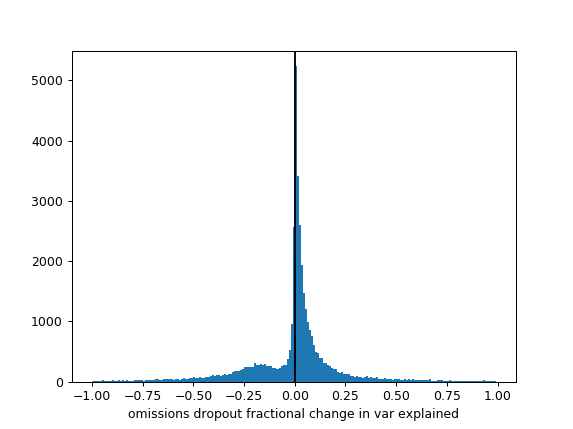

Text(0.5, 0, 'omissions dropout fractional change in var explained')

In [26]:
fig,ax=plt.subplots()
ax.hist(rspm['omissions'],bins=np.arange(-1,1,0.01))
ax.axvline(0,color='black')
ax.set_xlabel('omissions dropout fractional change in var explained')

### make a new column that identifies cells as 'modulated' by running or omissions (the threshold is up for debate!)

In [27]:
def is_modulated(v, threshold=0):
    return v < threshold
rspm['omission_modulated'] = rspm['omissions'].map(lambda v:is_modulated(v, threshold=0))
rspm['running_modulated'] = rspm['running'].map(lambda v:is_modulated(v, threshold=0))

### plot the tsne results, coloring dots in different ways
It looks like they cluster almost perfectly by omission modulation!

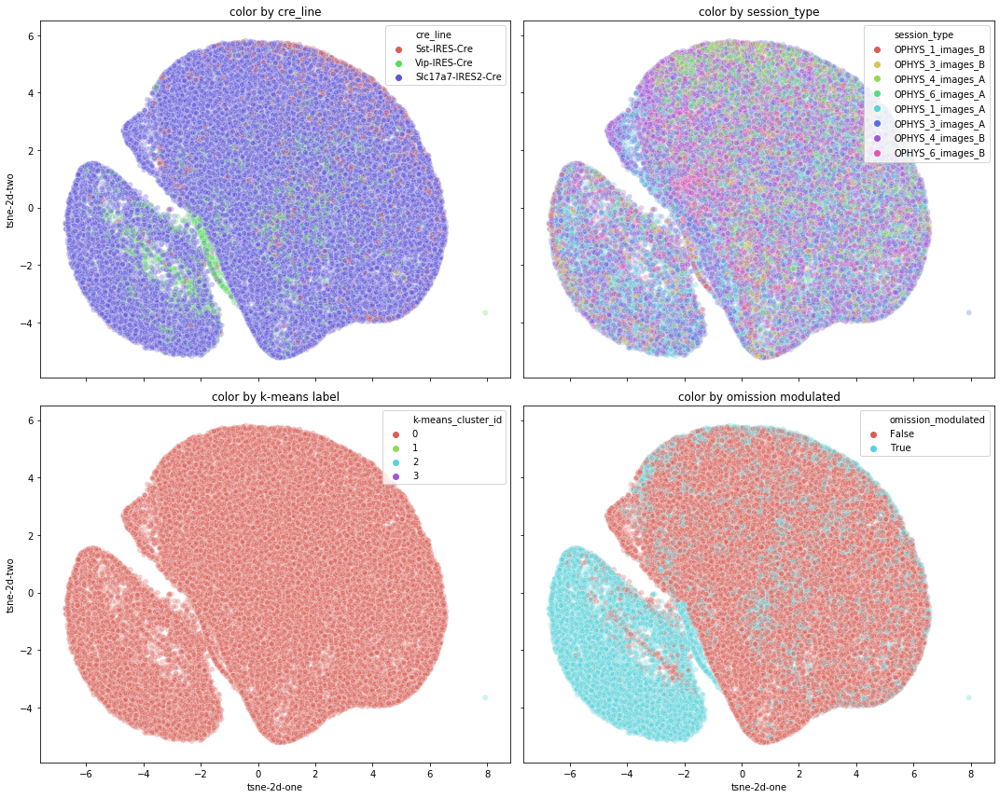

In [32]:

fig,ax=plt.subplots(2,2,figsize=(15,12),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="cre_line",
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[0,0]
)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_type",
    palette=sns.color_palette("hls", 8),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[0,1]
)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="k-means_cluster_id",
    palette=sns.color_palette("hls", 4),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[1,0]
)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue='omission_modulated',
    palette=sns.color_palette("hls", 2),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax[1,1]
)
fig.tight_layout()
for ii,hue in enumerate(['cre_line','session_type','k-means label', 'omission modulated']):
    ax.flatten()[ii].set_title('color by {}'.format(hue))
fig.tight_layout()

### plot tsne again, grouped by cre-line

Text(0.5, 1.0, 'Sst only')

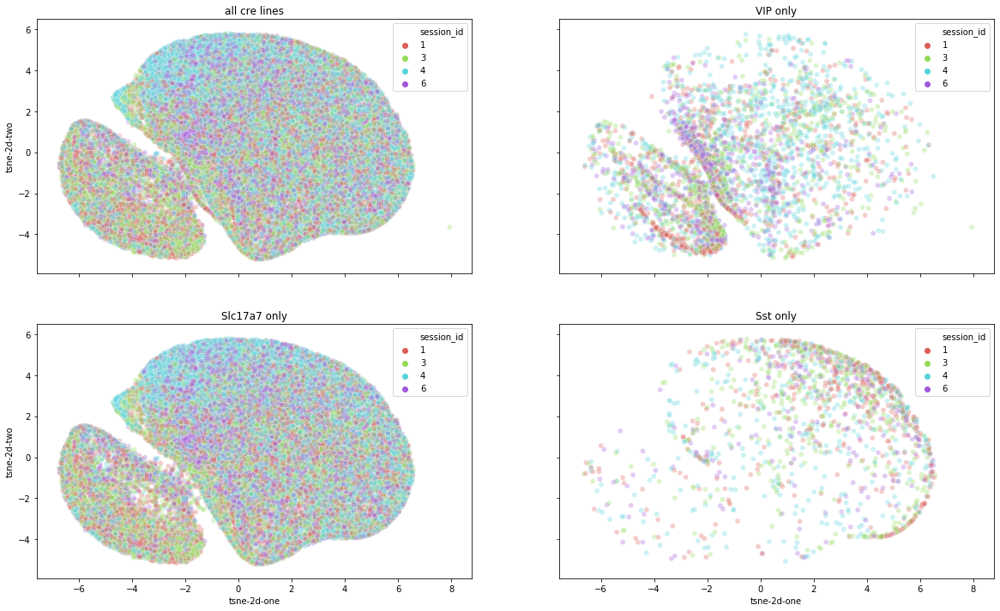

In [33]:
fig,ax=plt.subplots(2,2,figsize=(20,12),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm, #.query('cre_line=="Vip-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[0,0]
)
ax[0,0].set_title('all cre lines')

sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Vip-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[0,1]
)
ax[0,1].set_title('VIP only')

sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Slc17a7-IRES2-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[1,0]
)
ax[1,0].set_title('Slc17a7 only')

sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm.query('cre_line=="Sst-IRES-Cre"'),
    legend='full',
    alpha=0.3,
    ax=ax[1,1]
)
ax[1,1].set_title('Sst only')

### plot tsne again, colored continuously by the omissions dropout

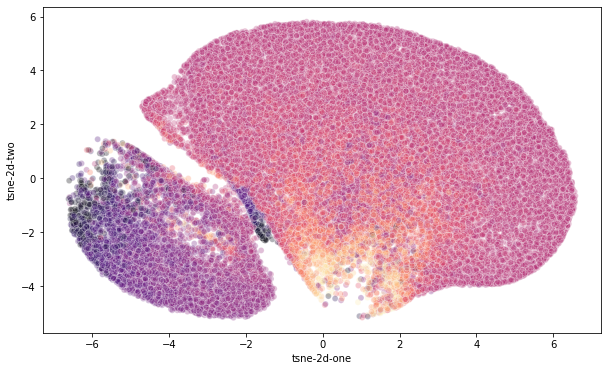

In [34]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue='omissions',
    palette='magma',
    data=rspm.query('omissions>-1 and omissions<1'),
    legend=False,
    alpha=0.3,
    ax=ax
)


### do PCA
a huge amount of variance is in just the first few PCs!

In [35]:
rspm

,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,...,visual,cre_line,session_type,equipment_name,session_id,k-means_cluster_id,tsne-2d-one,tsne-2d-two,omission_modulated,running_modulated
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,...,-0.228425,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3,1,0,-0.448700,4.713339,False,True
1,1000743008_1003146177,-0.0,0.085372,-0.009939,-0.004046,-0.123170,-0.096961,-0.024053,-0.008854,-0.028034,...,-0.039939,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3,1,0,-4.606377,-4.152587,True,True
2,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,...,-0.252412,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3,1,0,-0.407449,5.356506,False,True
3,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,...,-0.319959,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3,1,0,0.565486,4.620535,True,False
4,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,...,-0.435852,Sst-IRES-Cre,OPHYS_1_images_B,CAM2P.3,1,0,3.015221,4.937567,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42675,995439942_994310000,0.0,-0.485011,0.007001,0.004174,0.067006,0.025908,0.024597,0.014368,0.014290,...,-0.542672,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4,6,0,2.923807,1.532462,False,False
42676,995439942_994310003,0.0,-1.118526,0.042506,0.000775,0.003791,0.001357,0.004339,0.000590,-0.000652,...,-1.165996,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4,6,0,4.272765,-3.839030,False,False
42677,995439942_994310018,0.0,-0.541743,0.006398,0.003886,0.040050,0.036957,0.039209,0.019981,-0.008514,...,-0.598106,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4,6,0,3.249178,1.361587,False,False
42678,995439942_994310024,0.0,-0.277435,0.013547,0.000625,0.005525,0.004325,0.005053,0.000903,0.003351,...,-0.380402,Sst-IRES-Cre,OPHYS_6_images_A,CAM2P.4,6,0,1.467230,3.987008,True,True


In [36]:
cols_for_clustering

['Full',
 'all-images',
 'beh_model',
 'change',
 'correct_rejects',
 'false_alarms',
 'hits',
 'image_expectation',
 'intercept',
 'misses',
 'model_bias',
 'model_omissions1',
 'model_task0',
 'model_timing1D',
 'omissions',
 'post_lick_bouts',
 'post_licks',
 'pre_lick_bouts',
 'pre_licks',
 'pupil',
 'rewards',
 'running',
 'time']

In [37]:
np.shape(rspm[cols_for_clustering].values)

(42680, 23)

In [38]:

pca = PCA(n_components=len(cols_for_clustering))
pca_result = pca.fit_transform(rspm[cols_for_clustering].values)
rspm['pc1'] = pca_result[:,0]
rspm['pc2'] = pca_result[:,1] 
rspm['pc3'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
    

Explained variation per principal component: [9.97536282e-01 2.17462534e-03 2.06855157e-04 6.90851745e-05
 6.38625299e-06 2.54729130e-06 1.18190408e-06 1.00808063e-06
 5.50878424e-07 4.45064188e-07 2.37541244e-07 2.03531242e-07
 1.64435147e-07 1.41774957e-07 9.31008957e-08 6.36715542e-08
 4.61766848e-08 3.10256208e-08 2.75506570e-08 1.48927704e-08
 8.57873448e-09 3.47368975e-10 0.00000000e+00]


In [40]:
np.shape(pca.components_)

(23, 23)

Text(0, 0.5, 'variance explained')

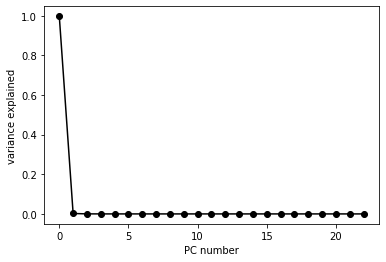

In [41]:
fig,ax=plt.subplots()
ax.plot(
    np.arange(len(cols_for_clustering)),
    pca.explained_variance_ratio_,
    'o-k'
)
ax.set_xlabel('PC number')
ax.set_ylabel('variance explained')

In [42]:
np.shape(pca_result)

(42680, 23)

In [43]:
np.shape(pca_result[0,:])

(23,)

### examine the PC components individually

followups
* remove redundant features before performing PCA
* Only plot PC dimensions that explain a reasonable amount of variance (each PC will sum to one, so low variance PCs will be misleading).

In [44]:
pca.components_[:,0].sum()

1.0

In [45]:
pca.components_[:,0]

array([-0., -0.,  0., -0., -0.,  0.,  0.,  0., -0.,  0., -0.,  0., -0.,
        0.,  0., -0., -0., -0.,  0.,  0.,  0., -0.,  1.])

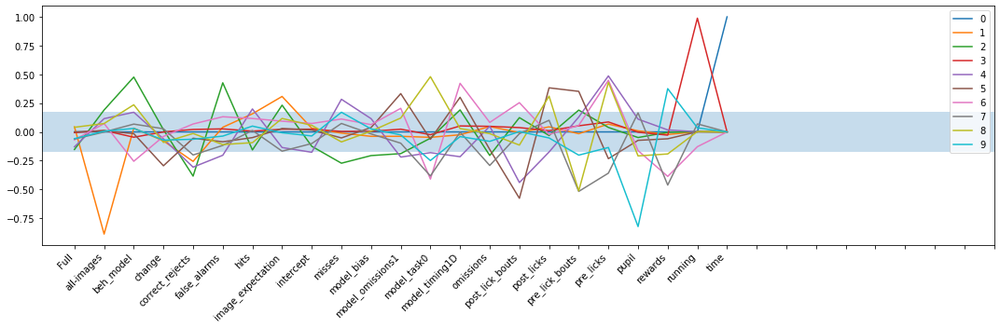

In [46]:
fig,ax=plt.subplots(figsize=(15,5))
N_PCs = 10
for PC in range(N_PCs):
    ax.plot(
        pca.components_[:,PC]
    )
ax.legend(np.arange(N_PCs))
ax.axhspan(1/np.sqrt(32),-1/np.sqrt(32),zorder=-np.inf,alpha=0.25)
ax.set_xticks(np.arange(32))
ax.set_xticklabels(cols_for_clustering,rotation=45,ha='right')
fig.tight_layout()

### Can I do k-means in PCA space?
No, it is still assigning nearly all cells to a single cluster

In [47]:
pc_cols = ['pc1','pc2','pc3']
kmeans = KMeans(n_clusters=3)
kmeans.fit(rspm[pc_cols])
rspm['k-means_on_PCs'] = kmeans.fit_predict(rspm[pc_cols])
rspm['k-means_on_PCs'].value_counts()

0    42678
2        1
1        1
Name: k-means_on_PCs, dtype: int64

### plot PCA results, colored by cre-line

(-1, 1)

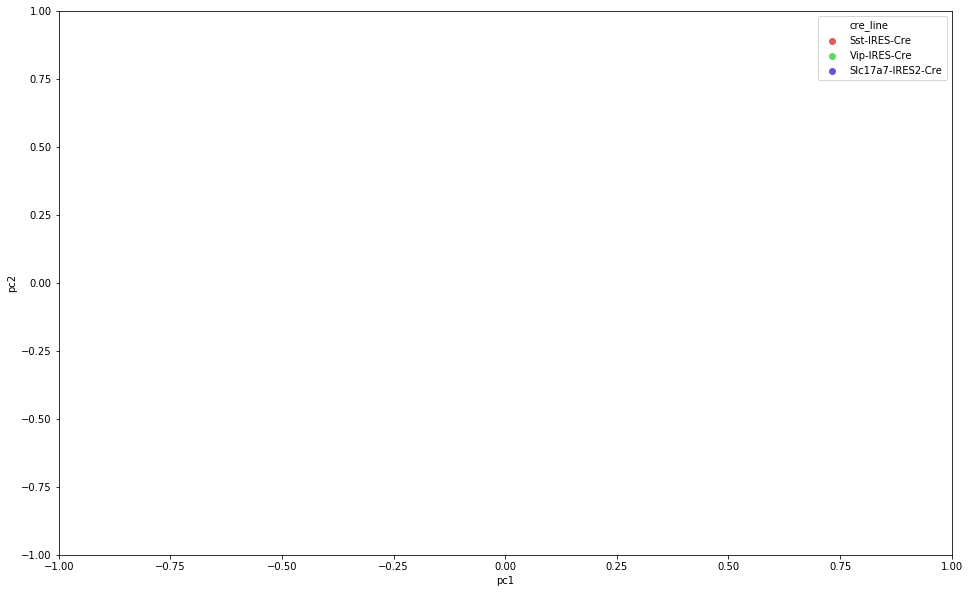

In [48]:
fig,ax = plt.subplots(figsize=(16,10))
sns.scatterplot(
    x="pc1", y="pc2",
    hue="cre_line",
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend="full",
    alpha=0.3,
    ax=ax
)

ax.set_xlim(-1,1)
ax.set_ylim(-1,1)

In [ ]:
rspm.query('cre_line=="Sst-IRES-Cre"')

In [70]:
rspm.keys()

Index(['identifier', 'Full', 'all-images', 'beh_model', 'change',
       'correct_rejects', 'false_alarms', 'hits', 'image0', 'image1', 'image2',
       'image3', 'image4', 'image5', 'image6', 'image7', 'image_expectation',
       'intercept', 'misses', 'model_bias', 'model_omissions1', 'model_task0',
       'model_timing1D', 'omissions', 'post_lick_bouts', 'post_licks',
       'pre_lick_bouts', 'pre_licks', 'pupil', 'rewards', 'running', 'time',
       'visual', 'cre_line', 'session_type', 'equipment_name', 'session_id',
       'k-means_cluster_id', 'tsne-2d-one', 'tsne-2d-two',
       'omission_modulated', 'running_modulated', 'pc1', 'pc2', 'pc3',
       'k-means_on_PCs', 'k-means_on_tSNE', 'hc', 'umap_3d_embedding_0',
       'umap_3d_embedding_1', 'umap_3d_embedding_2', 'umap_2d_embedding_0',
       'umap_2d_embedding_1', 'k-means_on_2d_umap', 'k-means_on_3d_umap'],
      dtype='object')

In [53]:
sample_size=1000
dfs = []
for cre_line in rspm['cre_line'].unique():
    dfs.append(rspm.query('cre_line == @cre_line').sample(sample_size, random_state=0))
data_sample = pd.concat(dfs)
data_sample

,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,...,session_id,k-means_cluster_id,tsne-2d-one,tsne-2d-two,omission_modulated,running_modulated,pc1,pc2,pc3,k-means_on_PCs
11347,866518320_1017154525,-0.0,2.912692,0.017859,-0.052061,-0.698869,-2.979386e-03,-0.349223,-0.062681,-0.326999,...,1,0,-5.993806,0.564471,True,True,-29.270478,-3.506301,0.215765,0
31204,960960480_1007031649,0.0,-0.983204,0.027576,0.001815,0.010453,8.521400e-02,0.006702,-0.003612,0.001529,...,6,0,5.098176,-2.393358,False,True,-28.221552,1.004528,-0.644320,0
37238,978296110_1018079696,0.0,-0.030758,-0.002082,0.000243,0.003161,2.416028e-03,0.003258,-0.001432,-0.005692,...,4,0,-3.360824,4.499572,False,True,-28.143779,0.136062,-0.641511,0
10341,853363753_1028819224,0.0,-0.454026,-0.001527,0.000105,0.005031,-4.279810e-13,0.000522,0.000808,0.001035,...,4,0,3.930019,4.135837,False,True,-28.199881,0.511388,-0.635336,0
30217,956941841_1028821154,0.0,-0.293445,0.003476,0.000561,0.018555,2.122510e-02,0.003755,-0.003241,-0.054016,...,3,0,1.566968,3.606766,False,True,-28.265379,0.358443,-0.627161,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40412,993369860_1017239409,0.0,-0.034993,0.018105,0.000502,0.017562,1.208535e-02,0.008153,-0.001021,-0.002652,...,3,0,-4.222085,3.059936,False,True,-28.205587,0.119260,-0.659668,0
39815,992084633_1017242572,0.0,0.048694,0.001957,0.001869,0.024482,1.185548e-02,0.012779,0.012602,0.002435,...,1,0,-4.231621,1.871429,False,True,-28.223870,0.092456,-0.790561,0
35789,974945686_982816307,0.0,-0.007623,0.009565,0.000350,0.014289,-2.007667e-05,0.002445,-0.002036,0.000667,...,4,0,-3.365548,4.446601,True,True,-28.176678,0.128842,-0.624643,0
29369,953452368_1007048214,0.0,0.093839,0.681796,0.021001,0.203519,1.523227e-01,0.114295,0.075455,0.045759,...,3,0,-0.522903,-2.941333,False,True,-28.751756,0.546016,-1.342921,0


In [54]:
data_sample.keys()

Index(['identifier', 'Full', 'all-images', 'beh_model', 'change',
       'correct_rejects', 'false_alarms', 'hits', 'image0', 'image1', 'image2',
       'image3', 'image4', 'image5', 'image6', 'image7', 'image_expectation',
       'intercept', 'misses', 'model_bias', 'model_omissions1', 'model_task0',
       'model_timing1D', 'omissions', 'post_lick_bouts', 'post_licks',
       'pre_lick_bouts', 'pre_licks', 'pupil', 'rewards', 'running', 'time',
       'visual', 'cre_line', 'session_type', 'equipment_name', 'session_id',
       'k-means_cluster_id', 'tsne-2d-one', 'tsne-2d-two',
       'omission_modulated', 'running_modulated', 'pc1', 'pc2', 'pc3',
       'k-means_on_PCs'],
      dtype='object')

### make a 3D plotly plot of the PCA results (1000 cells from each cre line)

In [52]:
query_string = '''pc1>-1 and pc1 < 1 and pc2>-1 and pc2 < 1 and pc3>-1 and pc3 < 1'''
fig = px.scatter_3d(
    data_sample.query(query_string), 
    x='pc1', 
    y='pc2', 
    z='pc3',
    color='cre_line',
)
fig.update_traces(
    marker=dict(
        size=3,
        opacity=0.25
    )
)
fig.update_layout(
    margin=dict(l=30, r=30, t=10, b=10),
    width=1200,
    height=1000,
)
# fig.write_html("/home/dougo/code/dougollerenshaw.github.io/figures_to_share/2020.08.09_PCA_on_GLM.html")
# fig.show()

KeyError: 'cre_line'

### do kmeans clustring on the tsne space
It kinda works

In [57]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(rspm[pc_cols])
tsne_cols = ['tsne-2d-one','tsne-2d-two']
rspm['k-means_on_tSNE'] = kmeans.fit_predict(rspm[tsne_cols])
rspm['k-means_on_tSNE'].value_counts()

0    21850
1    20830
Name: k-means_on_tSNE, dtype: int64

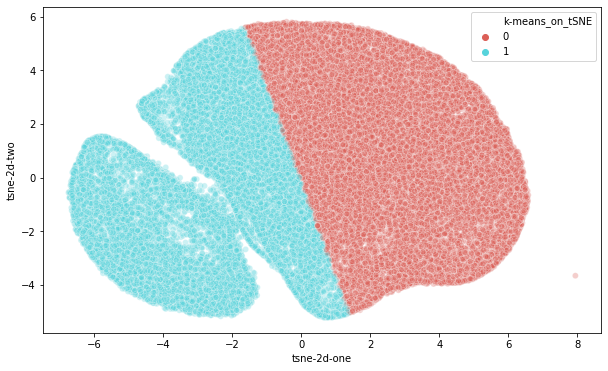

In [58]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x="tsne-2d-one", 
    y="tsne-2d-two",
    hue='k-means_on_tSNE',
    palette=sns.color_palette("hls", 2),
    data=rspm,
    legend='full',
    alpha=0.3,
    ax=ax,
)

### try agglomerative clustering?
It's also assigning to a single cluster

In [59]:
# import hierarchical clustering libraries
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

In [60]:

# create clusters
hc = AgglomerativeClustering(n_clusters=4, affinity = 'euclidean', linkage = 'ward')
# save clusters for chart
y_hc = hc.fit_predict(rspm[cols_for_clustering])

In [61]:
rspm['hc'] = y_hc
rspm['hc'].value_counts()

0    42677
3        1
2        1
1        1
Name: hc, dtype: int64

# UMAP

## try it out!

### perform both a 2d and 3d embedding

In [80]:
import umap

n_neighbors = 10
min_dist = 0
metric = 'euclidean'

reducer_2d = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)
reducer_3d = umap.UMAP(n_components=3, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric)

mapper_2d = reducer_2d.fit(rspm[cols_for_clustering])
mapper_3d = reducer_3d.fit(rspm[cols_for_clustering])

embedding_2d = reducer_2d.fit_transform(rspm[cols_for_clustering])
embedding_3d = reducer_3d.fit_transform(rspm[cols_for_clustering])
embedding_3d.shape

(42680, 3)

In [82]:
mapper_2d.embedding_.shape

(42680, 2)

In [91]:
mapper_2d.graph_

<42680x42680 sparse matrix of type '<class 'numpy.float32'>'
	with 640952 stored elements in Compressed Sparse Row format>

In [93]:
import networkx as nx

G = nx.from_scipy_sparse_matrix(mapper_2d.graph_)
# clustering = cylouvain.best_partition(G, resolution=1.5)
# clustering_solution = list(clustering.values())

In [104]:
graph = mapper_2d.graph_.toarray()


In [108]:
graph.max()

1.0

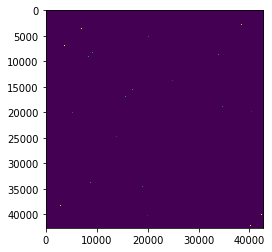

In [109]:
plt.imshow(graph, vmin=0, vmax=0.5)

In [111]:
save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\clustering\UMAP_output'


In [78]:
# filepath = os.path.join(save_dir, '200810_UMAP_2D_GLM_fraction_change_in_explained_variance')
# np.save(file=filepath, arr=embedding_2d)

In [76]:
# filepath = os.path.join(save_dir, '200810_UMAP_3D_GLM_fraction_change_in_explained_variance')
# np.save(file=filepath, arr=embedding_3d)

In [ ]:
# save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\clustering\UMAP_output'
# filepath = os.path.join(save_dir, '200810_UMAP_2D_GLM_fraction_change_in_explained_variance.npy')
# data = np.load(filepath)

### assign umap results to new columns

In [63]:
rspm['umap_3d_embedding_0'] = embedding_3d[:, 0]
rspm['umap_3d_embedding_1'] = embedding_3d[:, 1]
rspm['umap_3d_embedding_2'] = embedding_3d[:, 2]

rspm['umap_2d_embedding_0'] = embedding_2d[:, 0]
rspm['umap_2d_embedding_1'] = embedding_2d[:, 1]

### do kmeans on the 2d embedding
only two clusters since the 2d umap gives two clear clusters
k-means seems to identify them perfectly!

In [64]:
kmeans = KMeans(n_clusters=2)
umap_2d_cols = ['umap_2d_embedding_0','umap_2d_embedding_1']
rspm['k-means_on_2d_umap'] = kmeans.fit_predict(rspm[umap_2d_cols])
rspm['k-means_on_2d_umap'].value_counts()

0    32614
1    10066
Name: k-means_on_2d_umap, dtype: int64

### do kmeans on the 3d embedding

In [65]:
kmeans = KMeans(n_clusters=3)
umap_cols = ['umap_3d_embedding_0','umap_3d_embedding_1','umap_3d_embedding_2']
rspm['k-means_on_3d_umap'] = kmeans.fit_predict(rspm[umap_cols])
rspm['k-means_on_3d_umap'].value_counts()

2    20619
0    12015
1    10046
Name: k-means_on_3d_umap, dtype: int64

### plot the 3d results in 2d
k-means clearly didn't do a good job of identifying two of the three clusters

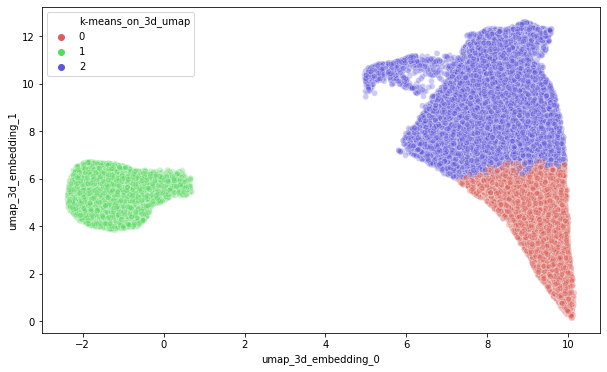

In [66]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1',
    hue='k-means_on_3d_umap',
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend='full',
    alpha=0.3,
    ax=ax,
)

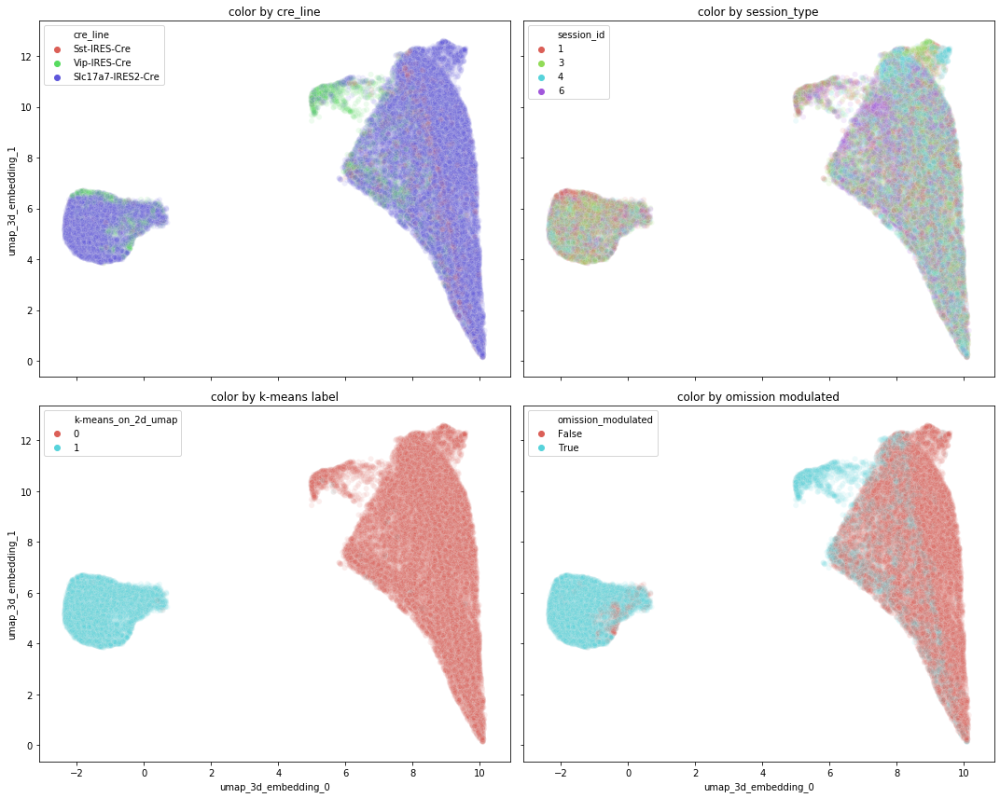

In [71]:
import seaborn as sns
fig,ax=plt.subplots(2,2,figsize=(15,12),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1',
    hue="cre_line",
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[0,0]
)
sns.scatterplot(
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1',
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[0,1]
)
sns.scatterplot(
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1',
    hue='k-means_on_2d_umap',
    palette=sns.color_palette("hls", len(rspm['k-means_on_2d_umap'].unique())),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[1,0]
)
sns.scatterplot(
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1',
    hue='omission_modulated',
    palette=sns.color_palette("hls", 2),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[1,1]
)
fig.tight_layout()
for ii,hue in enumerate(['cre_line','session_type','k-means label', 'omission modulated']):
    ax.flatten()[ii].set_title('color by {}'.format(hue))
fig.tight_layout()

### now make a 3d plotly plot of the same

In [67]:
import plotly.express as px
fig = px.scatter_3d(
    rspm, 
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1', 
    z='umap_3d_embedding_2',
    color='k-means_on_3d_umap'
)
fig.show()

### plot the 2d umap results

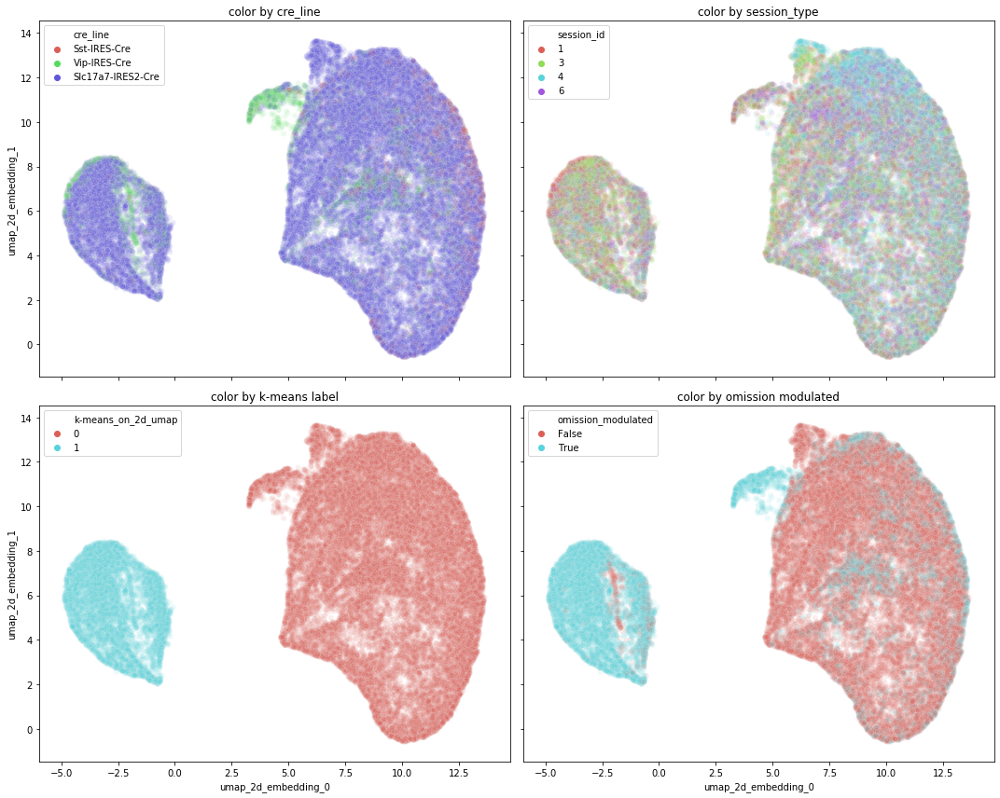

In [68]:
import seaborn as sns
fig,ax=plt.subplots(2,2,figsize=(15,12),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_2d_embedding_0', 
    y='umap_2d_embedding_1',
    hue="cre_line",
    palette=sns.color_palette("hls", 3),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[0,0]
)
sns.scatterplot(
    x='umap_2d_embedding_0', 
    y='umap_2d_embedding_1',
    hue="session_id",
    palette=sns.color_palette("hls", 4),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[0,1]
)
sns.scatterplot(
    x='umap_2d_embedding_0', 
    y='umap_2d_embedding_1',
    hue='k-means_on_2d_umap',
    palette=sns.color_palette("hls", len(rspm['k-means_on_2d_umap'].unique())),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[1,0]
)
sns.scatterplot(
    x='umap_2d_embedding_0', 
    y='umap_2d_embedding_1',
    hue='omission_modulated',
    palette=sns.color_palette("hls", 2),
    data=rspm,
    legend="full",
    alpha=0.1,
    ax=ax[1,1]
)
fig.tight_layout()
for ii,hue in enumerate(['cre_line','session_type','k-means label', 'omission modulated']):
    ax.flatten()[ii].set_title('color by {}'.format(hue))
fig.tight_layout()

### plot umap with omissions modulation as continuous color

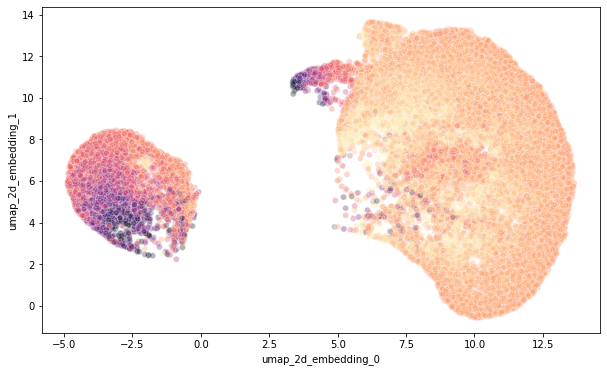

In [69]:
fig,ax=plt.subplots(1,1,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_2d_embedding_0', 
    y='umap_2d_embedding_1',
    hue='omissions',
    palette='magma',
    data=rspm.query('omissions>-1 and omissions<0.25'),
    legend=False,
    alpha=0.3,
    ax=ax,
)